In [1]:
# Imports
from data_loader import (
    load_syllable_data,
    load_tracking_data,
    load_fiber_data,
    align_and_merge_data
)
from data_processing import (
    compute_syllable_counts,
    rank_syllables,
    extract_signal_snippets
)
from plotting import plot_syllable_signal, mse_syllable_snippet
from analysis import (
    load_behavior_distances,
    compute_photometry_distance_matrix,
    compare_distance_matrices
)

from tqdm.notebook import tqdm

In [2]:
from collections import defaultdict
from tqdm import tqdm  # Assuming you are using tqdm for progress bar

# Use a lambda to create a three-level nested defaultdict with a structure for sum and count
all_avg_mses_ds = defaultdict(lambda: defaultdict(lambda: defaultdict(lambda: {'sum': 0.0, 'count': 0})))
all_avg_mses_vs = defaultdict(lambda: defaultdict(lambda: defaultdict(lambda: {'sum': 0.0, 'count': 0})))

all_suffixes = [
    56234, 177827, 1000000, 1778279, 3162277, 5623413, 10000000, 
    17782794, 31622776, 56234132, 100000000, 177827941, 
    316227766, 562341325, 1000000000
]

genotypes = ['WT', 'IFxDN HET']
injection_phases = ['pre', 'post']

# Parameters
for suffix in tqdm(all_suffixes):
    file_suffix = str(suffix)
    file_path = f'../soeren_syllable_data/results_h5/results_kappa_scan_{file_suffix}.h5'
    mouse_ids = list(range(16, 23))
    include_latent_state = True
    tracking_prefix_func = lambda s: f'../soeren_syllable_data/TrackingData_mus{s}.csv'
    fiber_prefix_func = lambda s: f'../soeren_syllable_data/sig_data_with_Scaled_zDFF_mus{s}.csv'
    parameters = {
        'm': 150,
        'n': 150,
        'normalization_frame': 0,
        'window_size': 15,
        'min_snippets_required': 10,
        # Add other parameters as needed
    }
    save_figs = False

    # Data Loading and Preprocessing
    syllable_dfs = load_syllable_data(file_path, include_latent_state)
    tracking_dfs = load_tracking_data(mouse_ids, tracking_prefix_func)
    fiber_dfs = load_fiber_data(mouse_ids, fiber_prefix_func)
    merged_dfs = align_and_merge_data(syllable_dfs, tracking_dfs, fiber_dfs)

    syllable_snippets_DS, syllable_snippets_VS = extract_signal_snippets(merged_dfs, parameters)

    for genotype in genotypes:
        for injection_phase in injection_phases:
            for syllable in range(30):  # Top 30 syllables
                mse_ds = mse_syllable_snippet(syllable_snippets_DS, genotype, injection_phase, syllable)
                mse_vs = mse_syllable_snippet(syllable_snippets_VS, genotype, injection_phase, syllable)
                
                # Update DS data if mse_ds is valid
                if mse_ds is not None:
                    all_avg_mses_ds[suffix][genotype][injection_phase]['sum'] += mse_ds
                    all_avg_mses_ds[suffix][genotype][injection_phase]['count'] += 1

                # Update VS data if mse_vs is valid
                if mse_vs is not None:
                    all_avg_mses_vs[suffix][genotype][injection_phase]['sum'] += mse_vs
                    all_avg_mses_vs[suffix][genotype][injection_phase]['count'] += 1

# Calculate average MSE for each combination
for suffix in all_suffixes:
    for genotype in genotypes:
        for injection_phase in injection_phases:
            # Calculate average for DS
            ds_data = all_avg_mses_ds[suffix][genotype][injection_phase]
            if ds_data['count'] > 0:
                all_avg_mses_ds[suffix][genotype][injection_phase] = ds_data['sum'] / ds_data['count']
            else:
                all_avg_mses_ds[suffix][genotype][injection_phase] = None  # No valid MSEs, set as None

            # Calculate average for VS
            vs_data = all_avg_mses_vs[suffix][genotype][injection_phase]
            if vs_data['count'] > 0:
                all_avg_mses_vs[suffix][genotype][injection_phase] = vs_data['sum'] / vs_data['count']
            else:
                all_avg_mses_vs[suffix][genotype][injection_phase] = None  # No valid MSEs, set as None


100%|██████████| 15/15 [03:24<00:00, 13.63s/it]


In [ ]:
syllable_snippets_DS

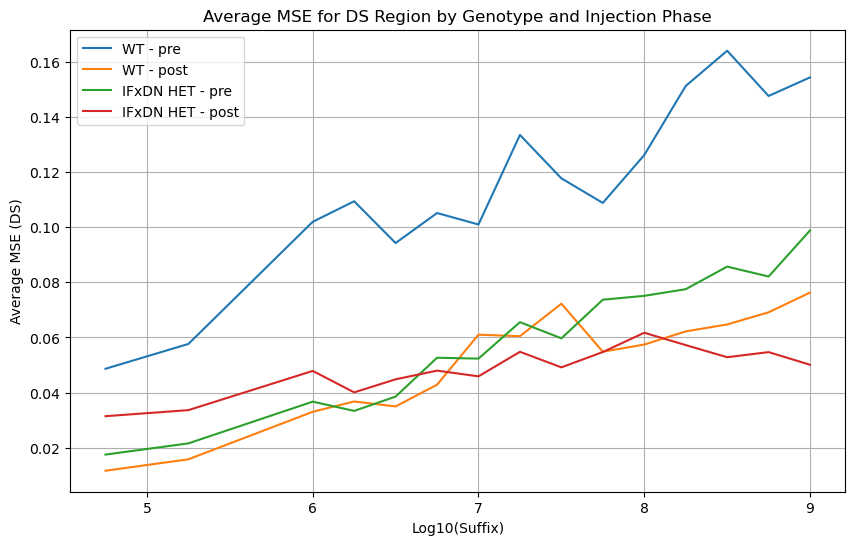

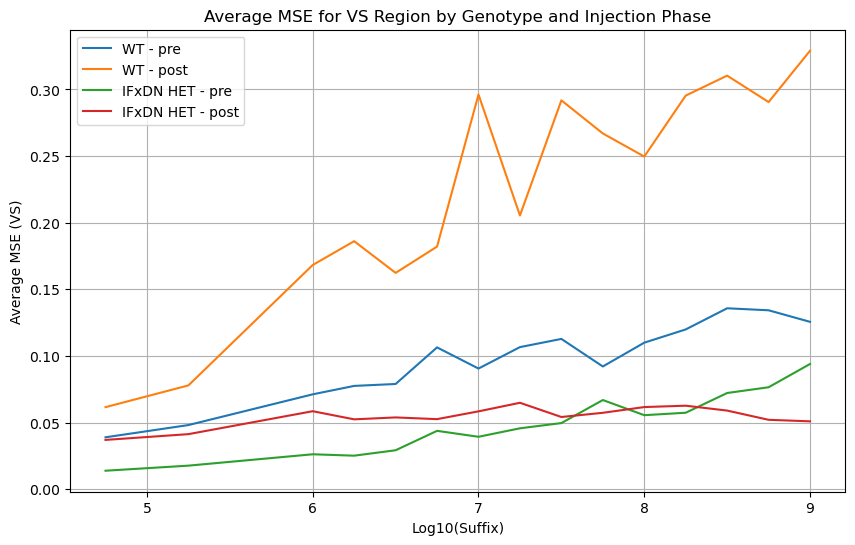

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Convert suffix values to log scale
log_suffixes = np.log10(all_suffixes)

# Loop through both brain regions (DS and VS)
for region, mse_data in zip(['DS', 'VS'], [all_avg_mses_ds, all_avg_mses_vs]):
    plt.figure(figsize=(10, 6))
    for genotype in genotypes:
        for injection_phase in injection_phases:
            # Extract average MSE values for the current region
            avg_mse = [mse_data[suffix][genotype][injection_phase] for suffix in all_suffixes]
            plt.plot(log_suffixes, avg_mse, label=f'{genotype} - {injection_phase}')
    plt.xlabel('Log10(Suffix)')
    plt.ylabel(f'Average MSE ({region})')
    plt.title(f'Average MSE for {region} Region by Genotype and Injection Phase')
    plt.legend()
    plt.grid(True)
    plt.show()


In [5]:
syllable_snippets_DS

defaultdict(<function data_processing.extract_signal_snippets.<locals>.<lambda>()>,
            {'IFxDN HET': defaultdict(<function data_processing.extract_signal_snippets.<locals>.<lambda>.<locals>.<lambda>()>,
                         {'pre': defaultdict(list,
                                      {0: array([[ 0.        ,  0.        ,  0.        , ...,  0.78746058,
                                                0.78647542,  0.78549026],
                                              [ 0.        ,  0.        ,  0.        , ..., -0.03224542,
                                               -0.03040291, -0.02856039],
                                              [ 0.        ,  0.        ,  0.07735512, ..., -0.03961958,
                                               -0.07225716, -0.1244982 ],
                                              ...,
                                              [ 0.        ,  0.10697955,  0.1426394 , ...,  0.9421771 ,
                                             

In [5]:
# Data Analysis
# initiations_proportions, time_spent_proportions = compute_syllable_counts(merged_dfs)
# avg_initiations_proportions, avg_time_spent_proportions, final_ranking = rank_syllables(initiations_proportions, time_spent_proportions)

In [ ]:
for syllable in range(30):  # Top 30 syllables
    mse_syllable_snippet(syllable_snippets_VS)
    mse_syllable_snippet(syllable_snippets_DS)

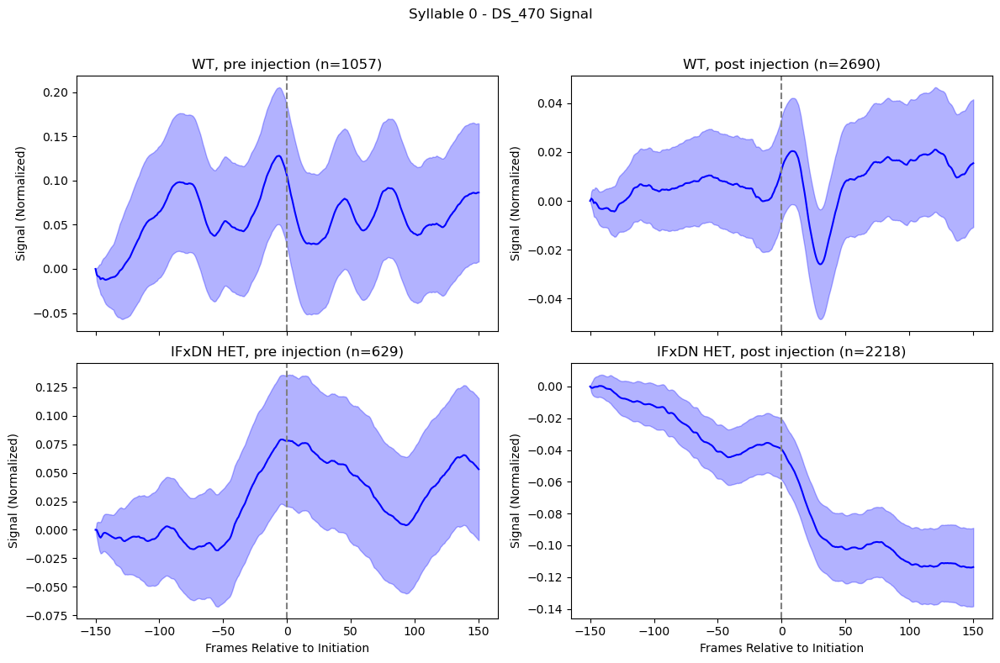

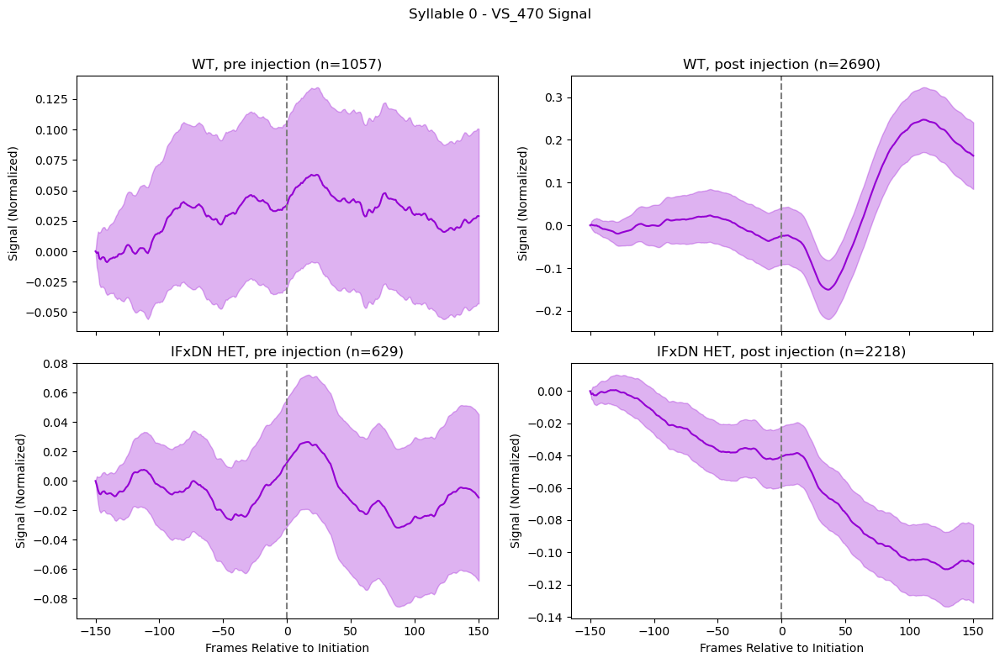

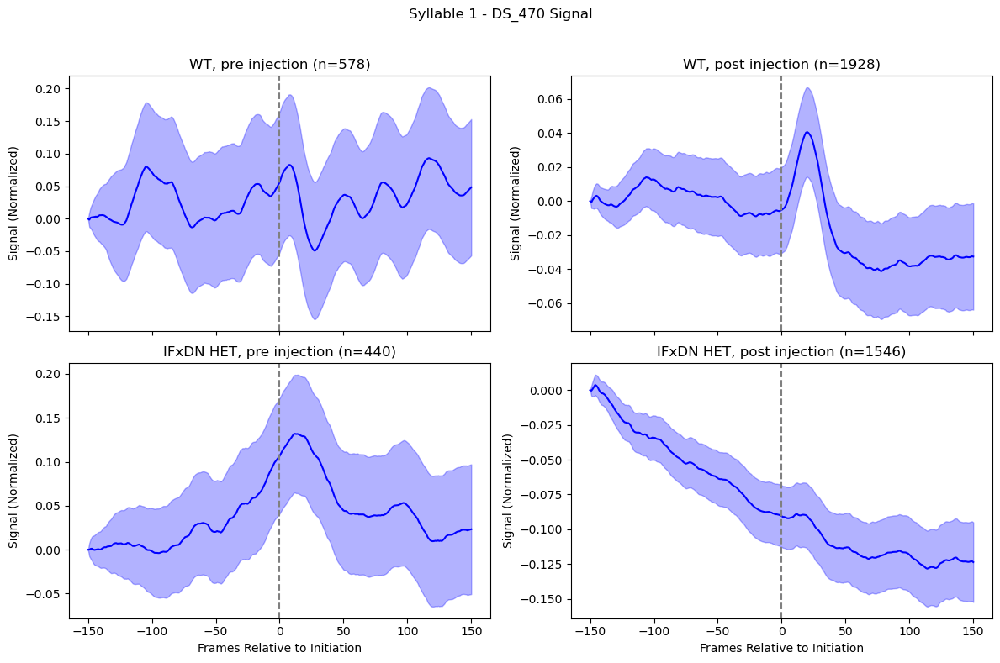

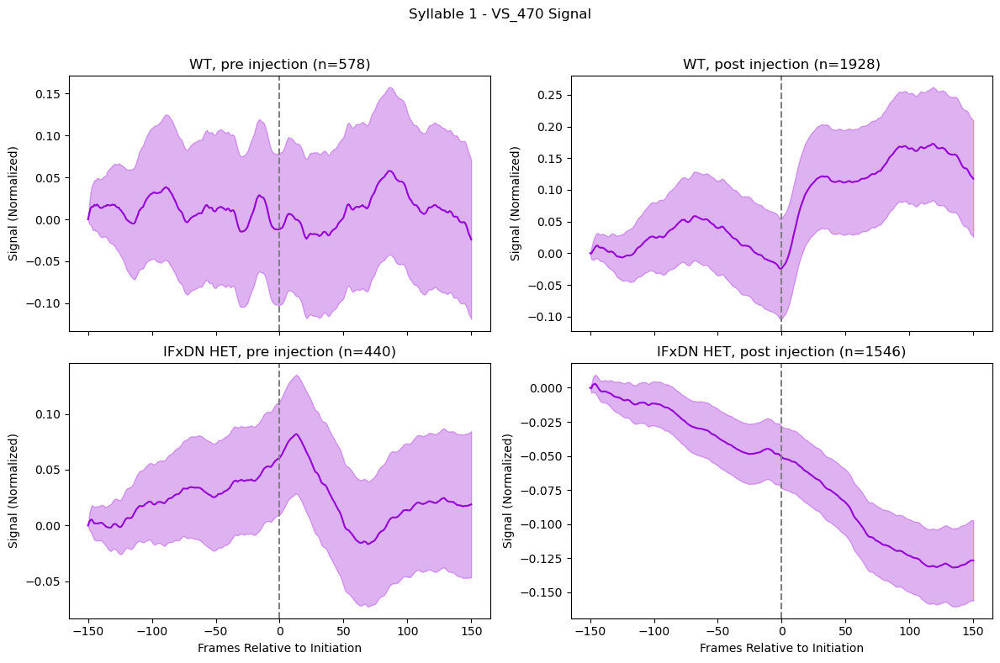

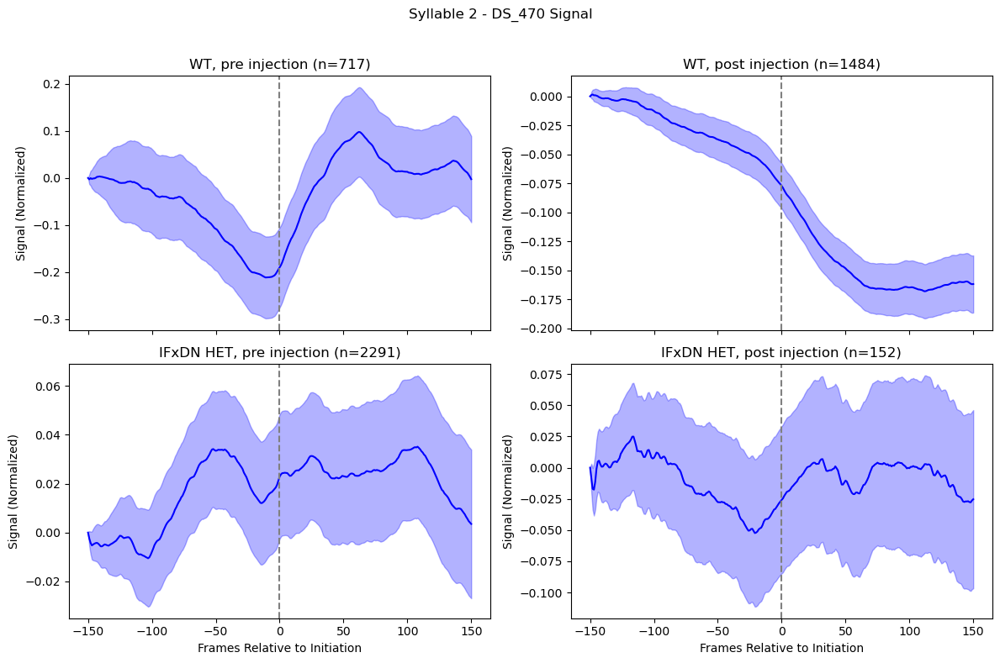

...

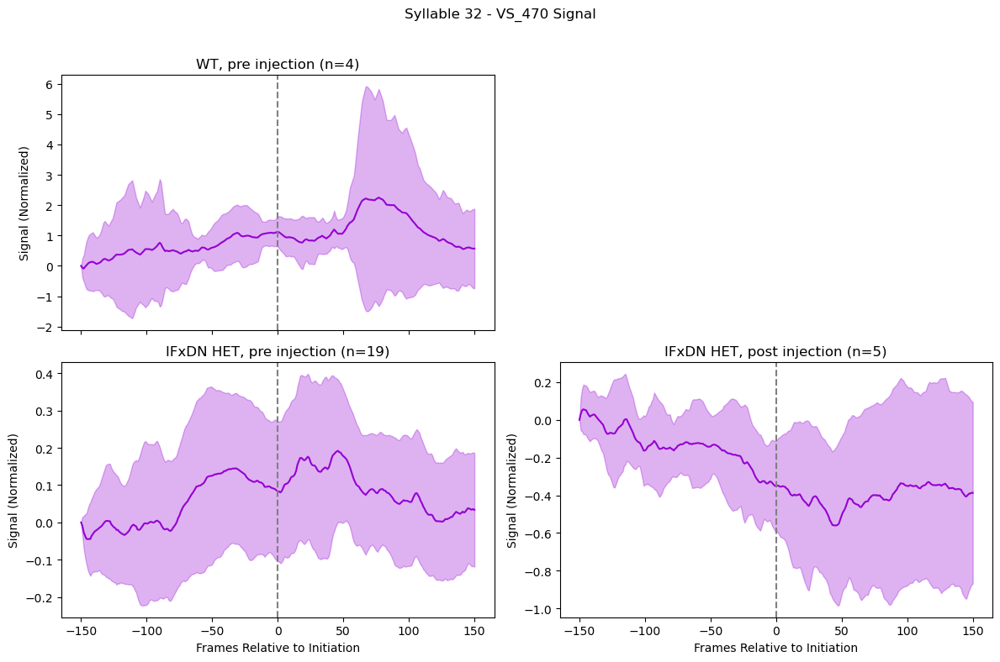

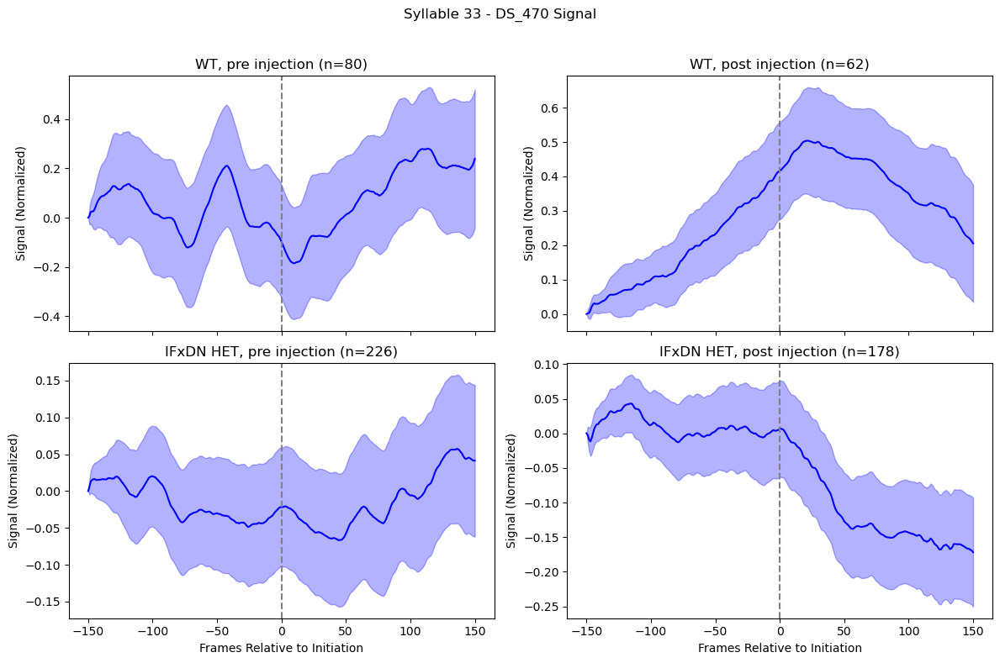

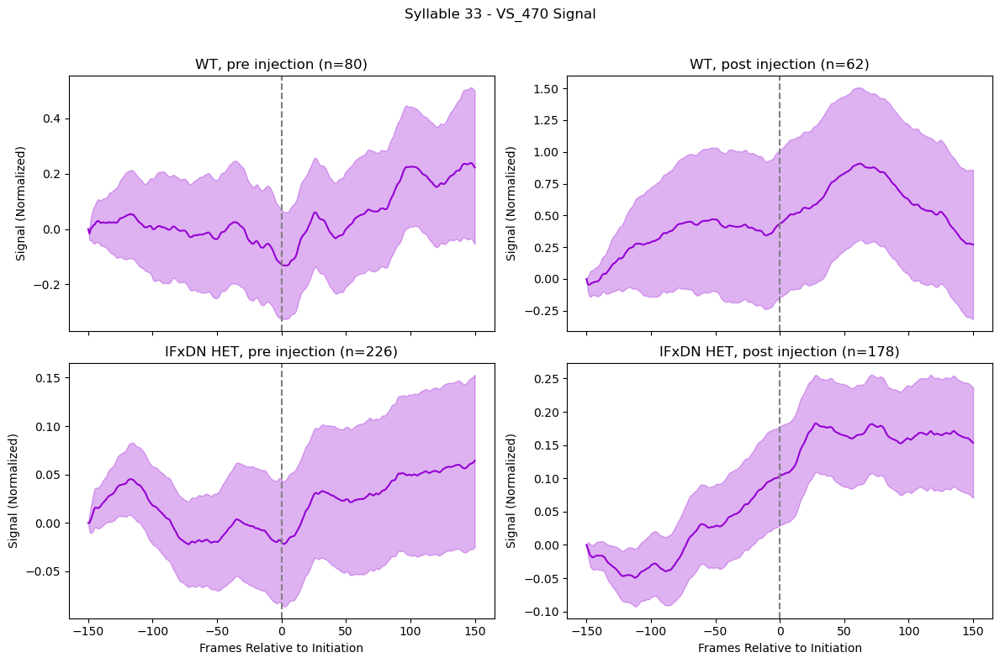

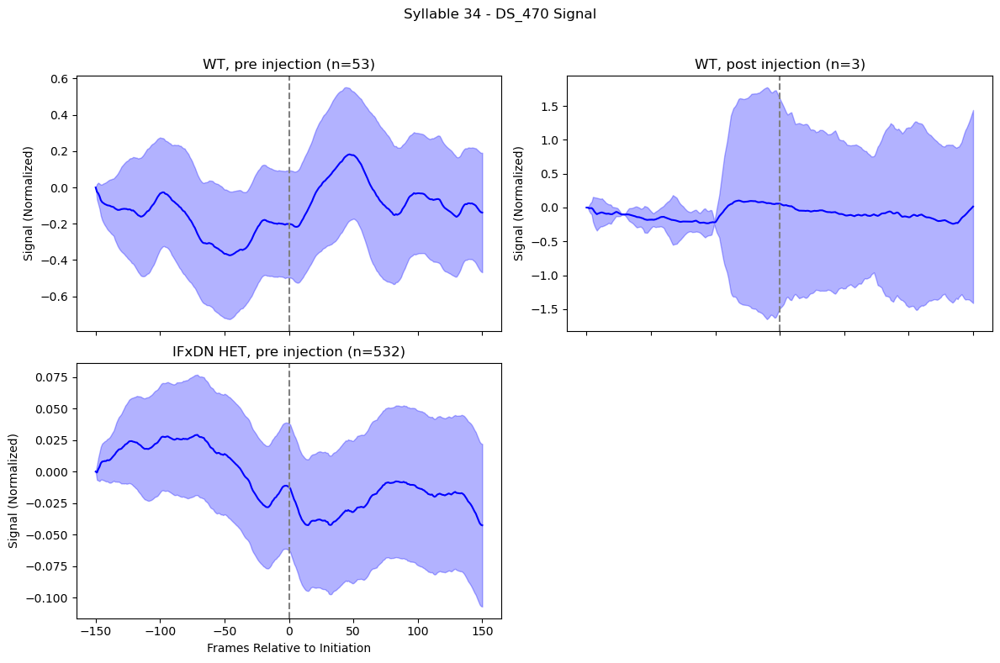

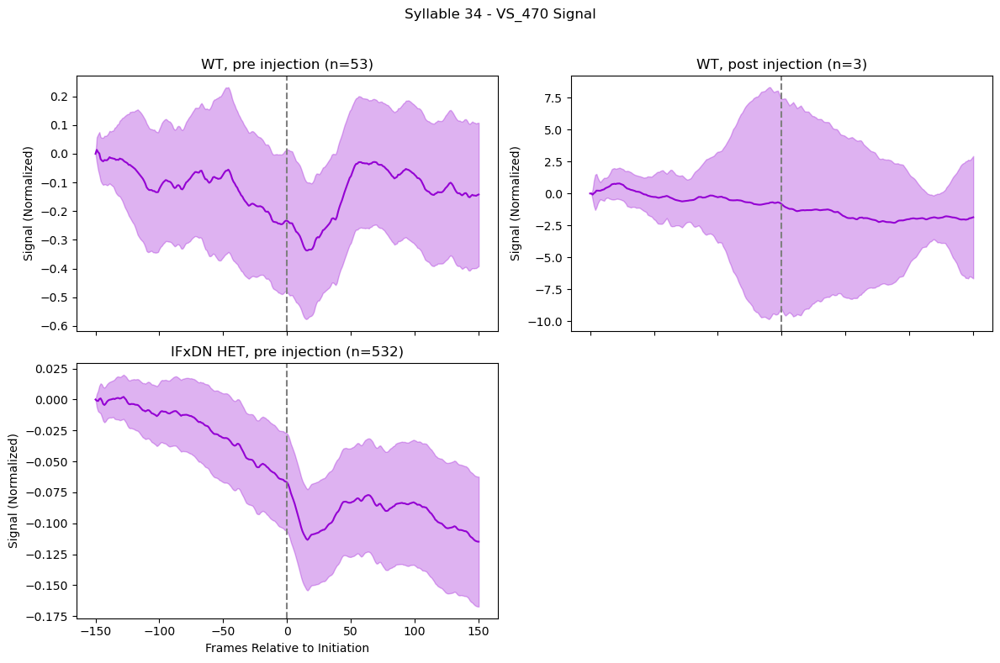

/Users/fsp585/anaconda3/envs/sund/lib/python3.11/site-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/fsp585/anaconda3/envs/sund/lib/python3.11/site-packages/numpy/core/_methods.py:254: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


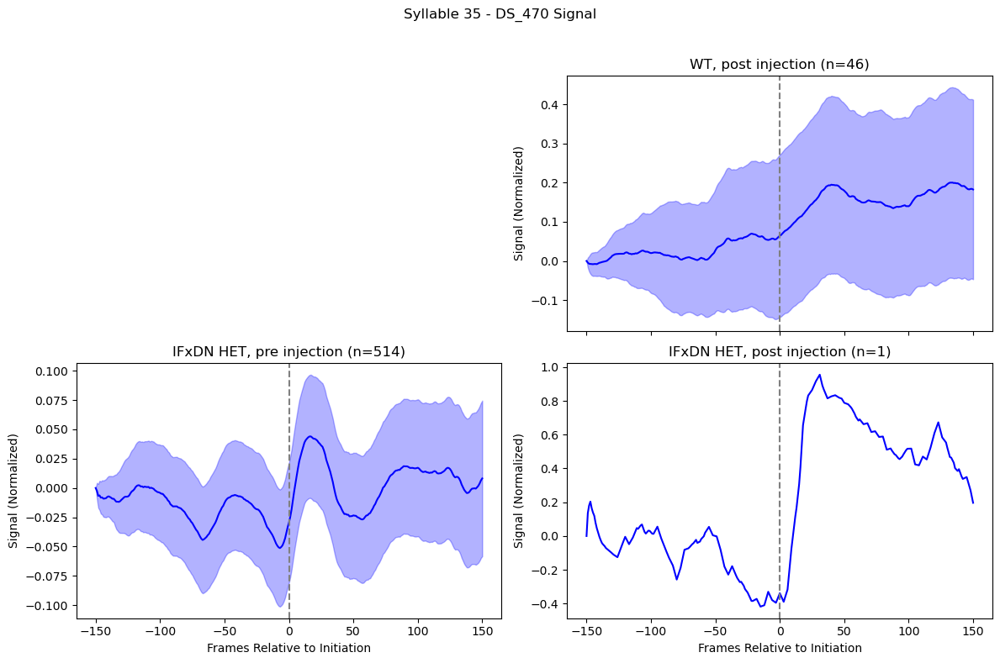

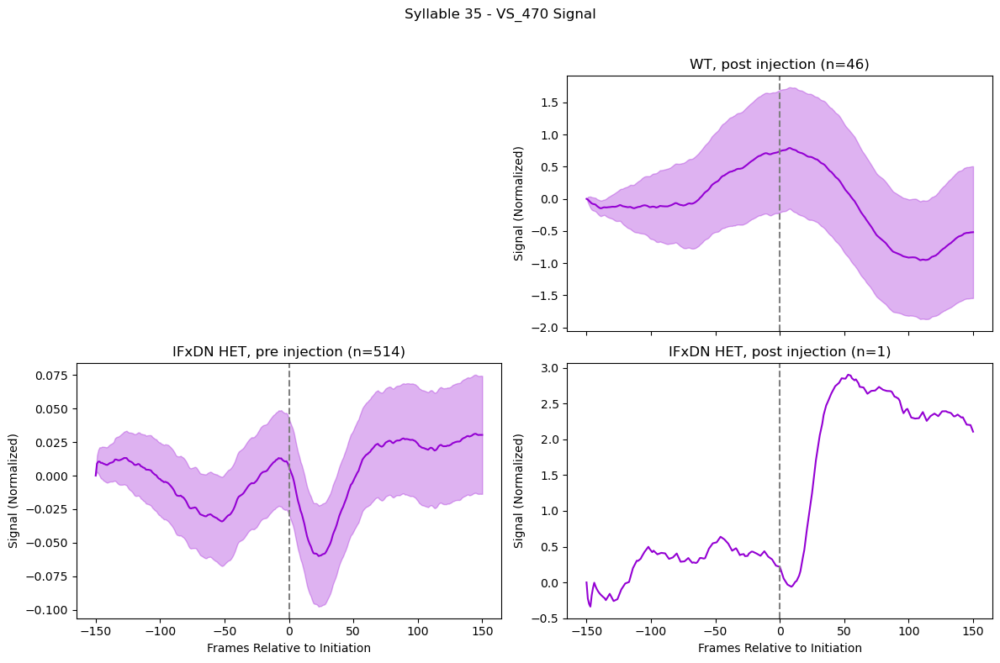

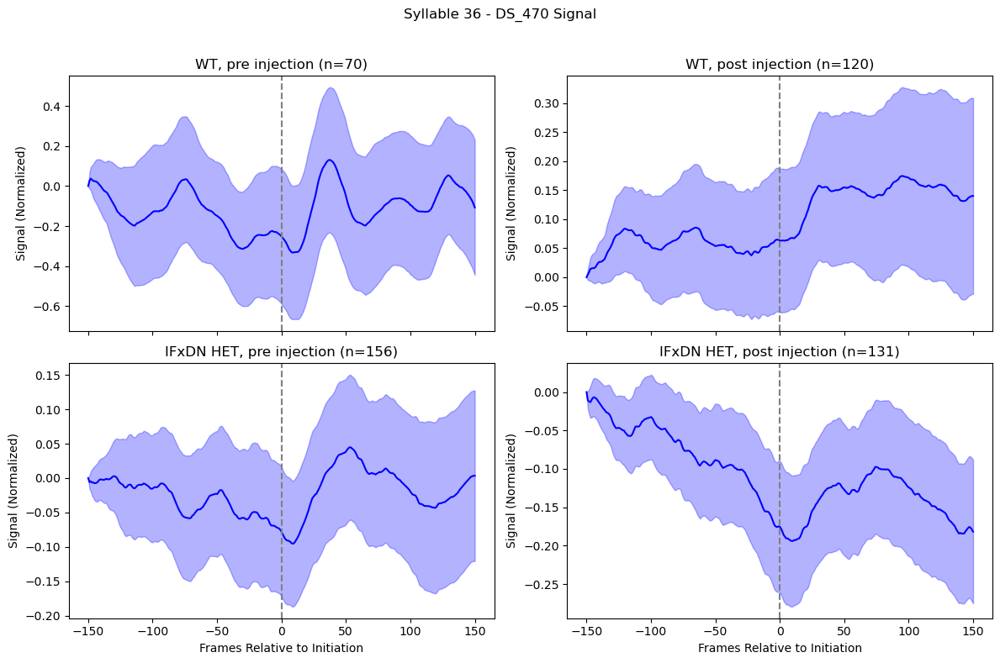

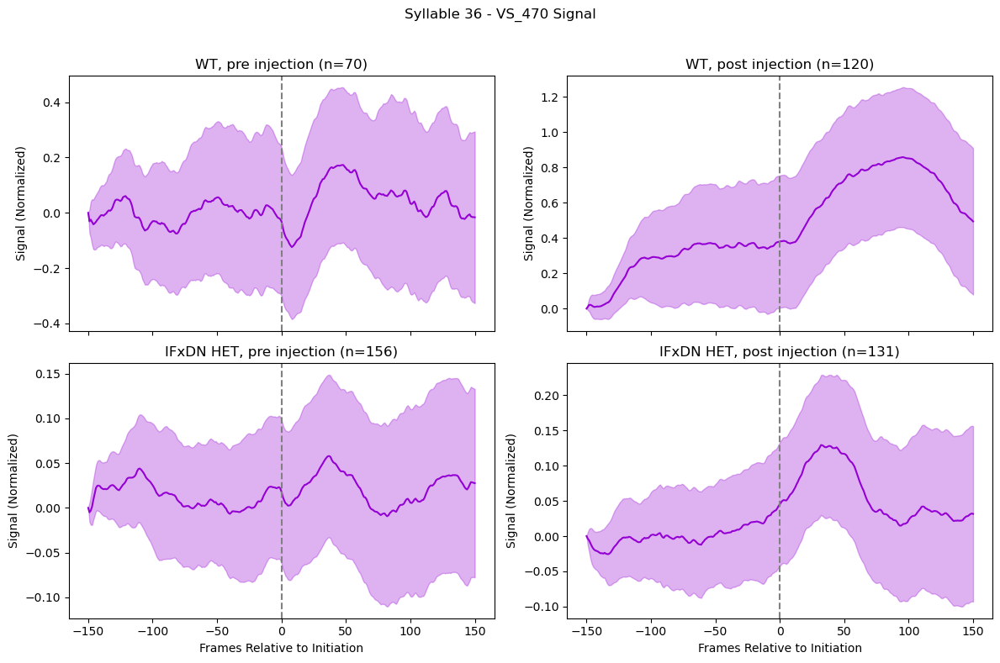

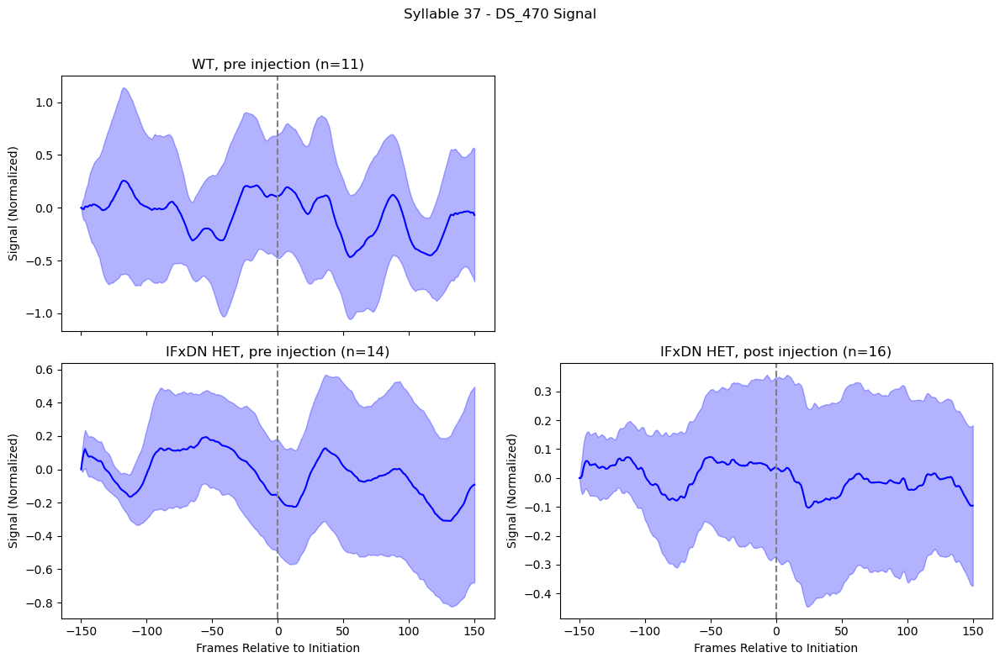

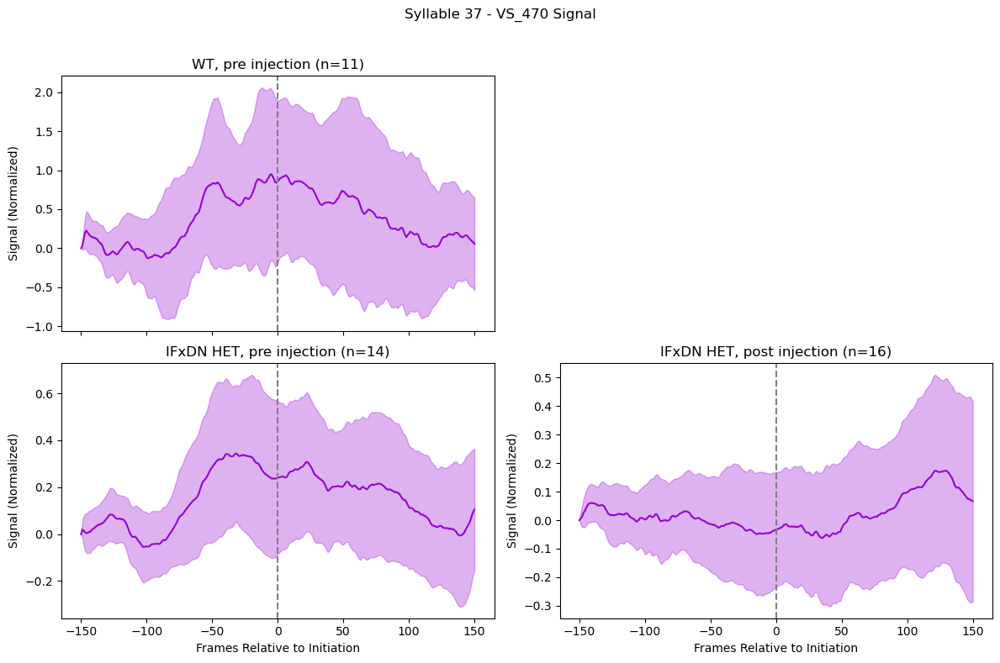

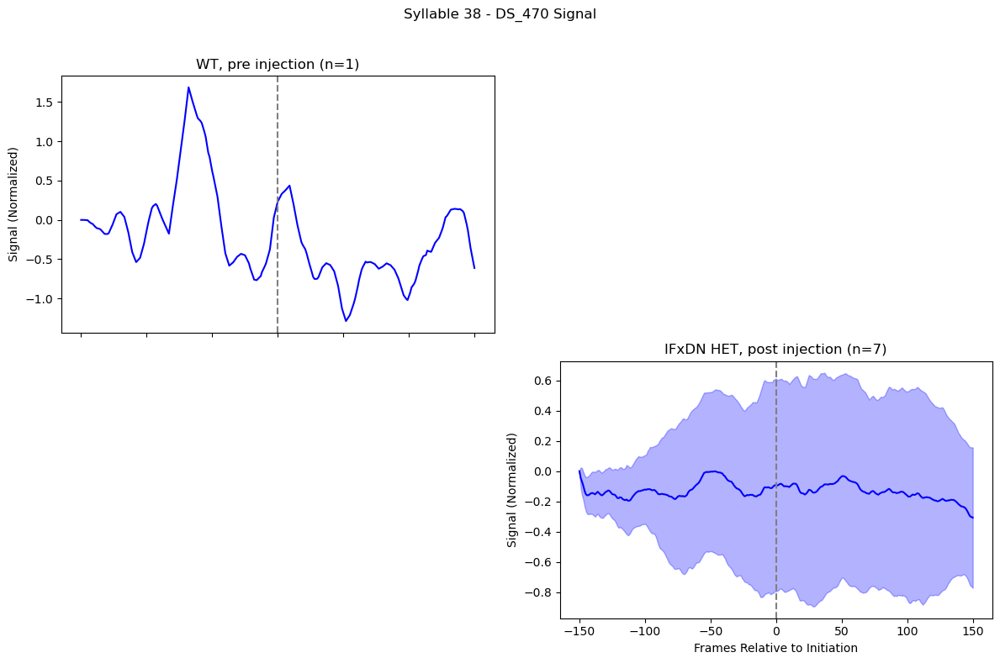

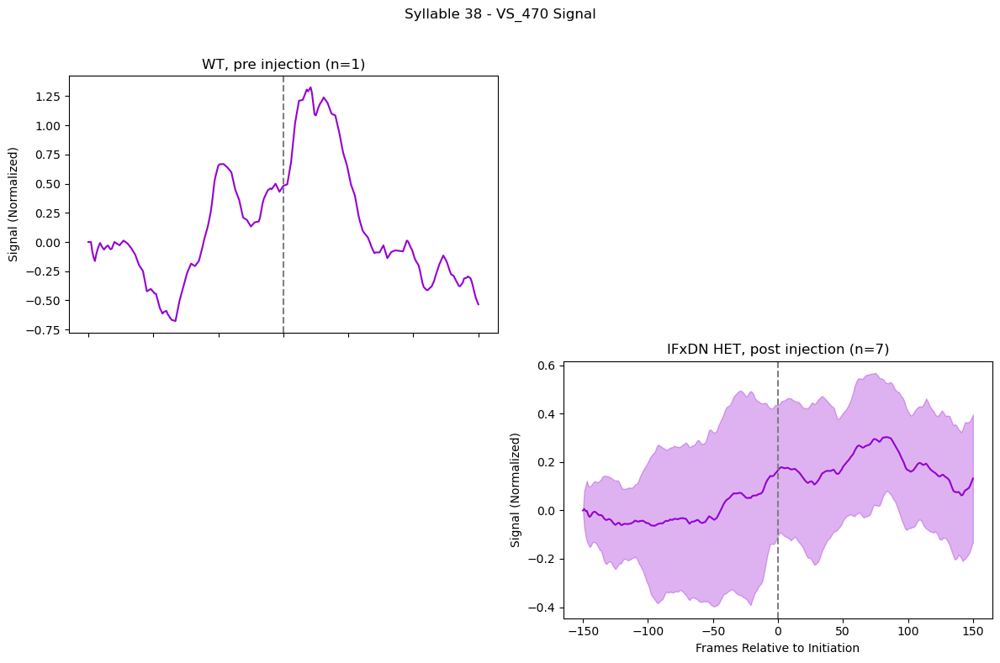

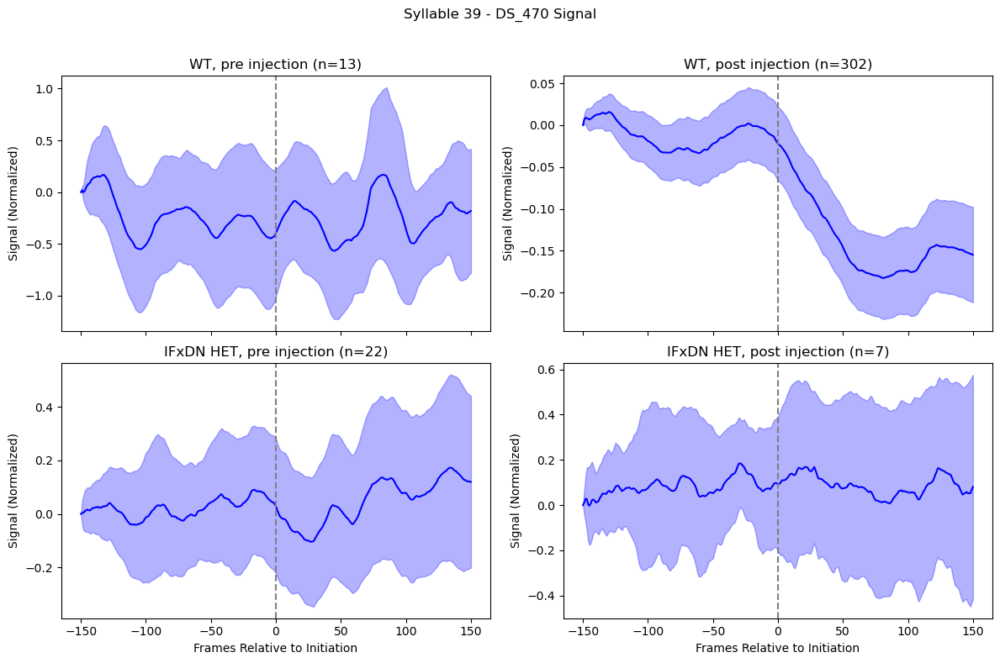

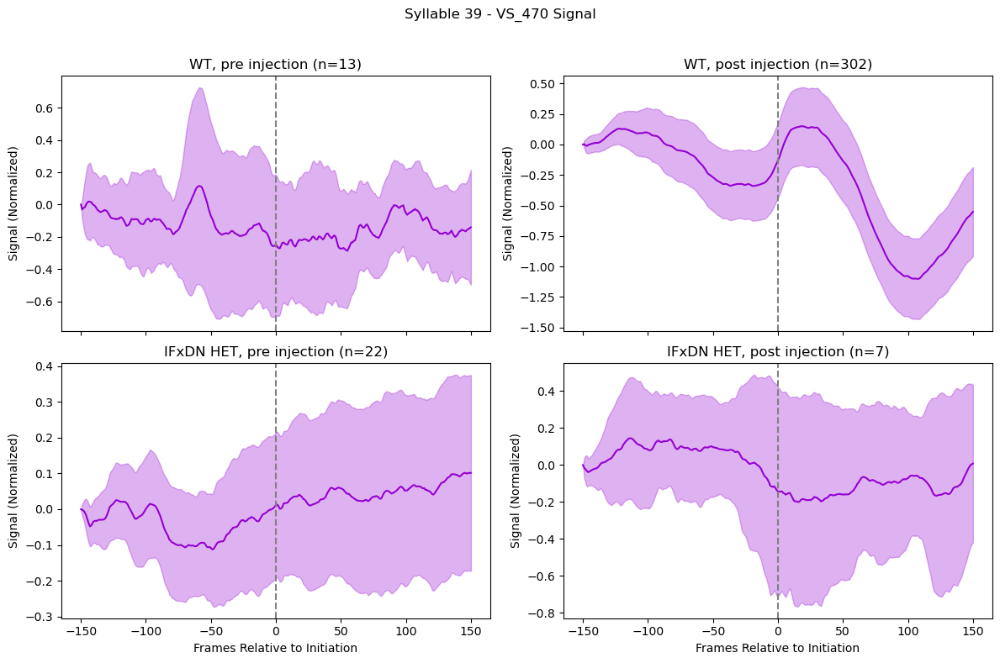

In [6]:
# Plotting
for syllable in range(30):  # Top 30 syllables
    plot_syllable_signal(syllable, 'DS', syllable_snippets_DS, save_figs=save_figs)
    plot_syllable_signal(syllable, 'VS', syllable_snippets_VS, save_figs=save_figs)

In [7]:
# Distance Matrix Comparison
behavior_pickle_pattern = f'../soeren_syllable_data/behavior_pickle/behavior_distances_*_{file_suffix}.pkl'
behavior_data = load_behavior_distances(behavior_pickle_pattern)
photometry_distances_DS, syllables_photometry_DS = compute_photometry_distance_matrix(
    syllable_snippets_DS, signal_type='DS', top_syllables=range(30), min_snippets=10
)
photometry_distances_VS, syllables_photometry_VS = compute_photometry_distance_matrix(
    syllable_snippets_VS, signal_type='VS', top_syllables=range(30), min_snippets=10
)

Loading behavior distance matrices with pattern: ../soeren_syllable_data/behavior_pickle/behavior_distances_*_3162277.pkl
Number of files found: 1
you found something!
Loaded file: ../soeren_syllable_data/behavior_pickle/behavior_distances_kappa_scan_3_3162277.pkl
Computed DS photometry distance matrix with shape: (30, 30)
Computed VS photometry distance matrix with shape: (30, 30)



Comparison for behavior_distances_kappa_scan_3_3162277.pkl:
  Spearman correlation coefficient: 0.003
  P-value: 9.487e-01
  Mantel test correlation coefficient: 0.003
  Mantel test P-value: 9.450e-01



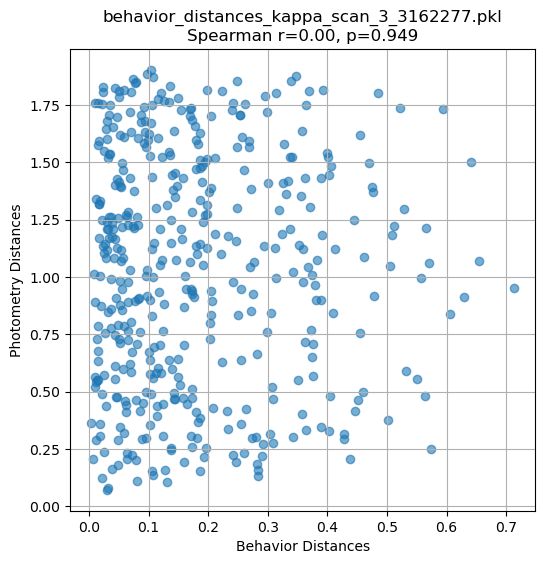

In [8]:
# Compare DS Photometry Distance Matrix
with open(f'results_DS_{file_suffix}.txt', 'w') as output_file:
    compare_distance_matrices(
        behavior_data,
        photometry_distances_DS,
        syllables_photometry_DS,
        top_syllables=range(30),
        min_snippets=10,
        output_file=output_file
    )


Comparison for behavior_distances_kappa_scan_3_3162277.pkl:
  Spearman correlation coefficient: 0.372
  P-value: 1.052e-15
  Mantel test correlation coefficient: 0.372
  Mantel test P-value: 2.000e-03



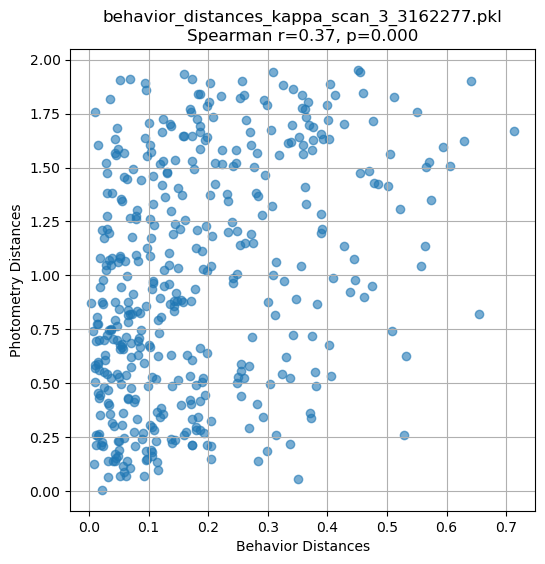

In [9]:
# Compare VS Photometry Distance Matrix
with open(f'results_VS_{file_suffix}.txt', 'w') as output_file:
    compare_distance_matrices(
        behavior_data,
        photometry_distances_VS,
        syllables_photometry_VS,
        top_syllables=range(30),
        min_snippets=10,
        output_file=output_file
    )